<a href="https://colab.research.google.com/github/Vargol/8GB_M1_Diffusers_Scripts/blob/main/SDXL/Diffusers_SDXL_IP_Adatper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

A different way to do IP Adaptors using Hugginface Diffusers.  
This one allows for multiple images, which can re-enforce the image prompt.  
This has been refered to as "Instant LoRA'
To run this you'll need to create a directory call 'dd', the script will use the images in there as the image prompts

In [1]:
%pip install --quiet --upgrade diffusers transformers accelerate mediapy
! git clone https://github.com/cubiq/Diffusers_IPAdapter.git
! mkdir image_encoder

! curl -Lo ip-adapter_sdxl.bin https://huggingface.co/h94/IP-Adapter/resolve/main/sdxl_models/ip-adapter_sdxl.bin


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 75.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 60.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 100.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 32.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 87.0 MB/s eta 0:00:00
Cloning into 'Diffusers_IPAdapter'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 74 (delta 16), reused 65 (delta 12), pack-reused 0
Receiving objects: 100% (74/74), 14.12 MiB | 32.87 MiB/s, done.
Resolving deltas: 100% (16/16), done.
  % Total    % R

In [2]:
import torch
from diffusers import StableDiffusionXLPipeline, AutoencoderKL, UniPCMultistepScheduler
from PIL import Image
import sys
import gc
import random
import mediapy
import glob


sys.path.insert(0,'/content/Diffusers_IPAdapter')

from ip_adapter.ip_adapter import  IPAdapter

base_model_path = "stabilityai/stable-diffusion-xl-base-1.0"

image_encoder_path = "InvokeAI/ip_adapter_sdxl_image_encoder"
ip_ckpt = "ip-adapter_sdxl.bin"
device = "cuda"


vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix",
                                    torch_dtype=torch.float16,
                                    force_upcast=False).to(device)

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

# load SDXL pipeline
pipe = StableDiffusionXLPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    variant='fp16',
    add_watermarker=False,
    vae=vae
)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to(device)
pipe.enable_vae_tiling()

ip_model = IPAdapter(pipe, ip_ckpt, image_encoder_path, device)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

,,

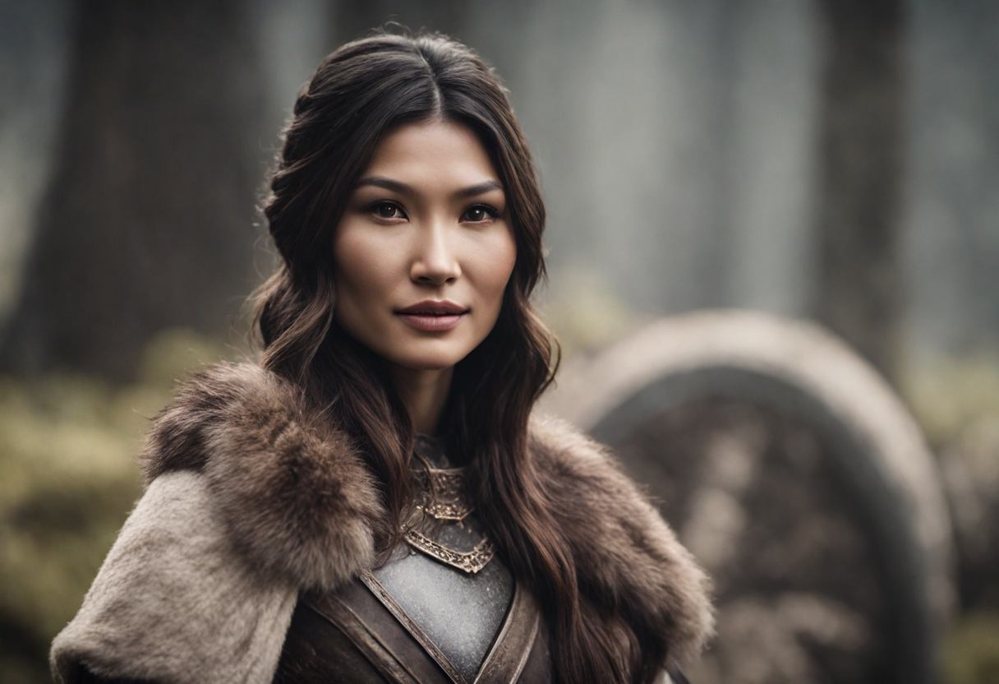
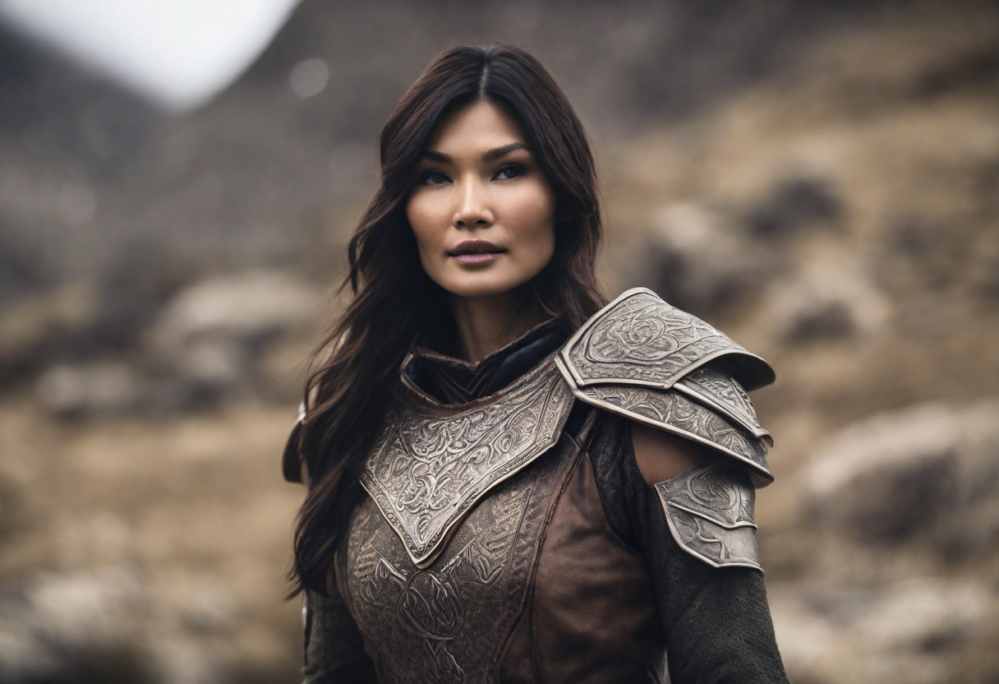
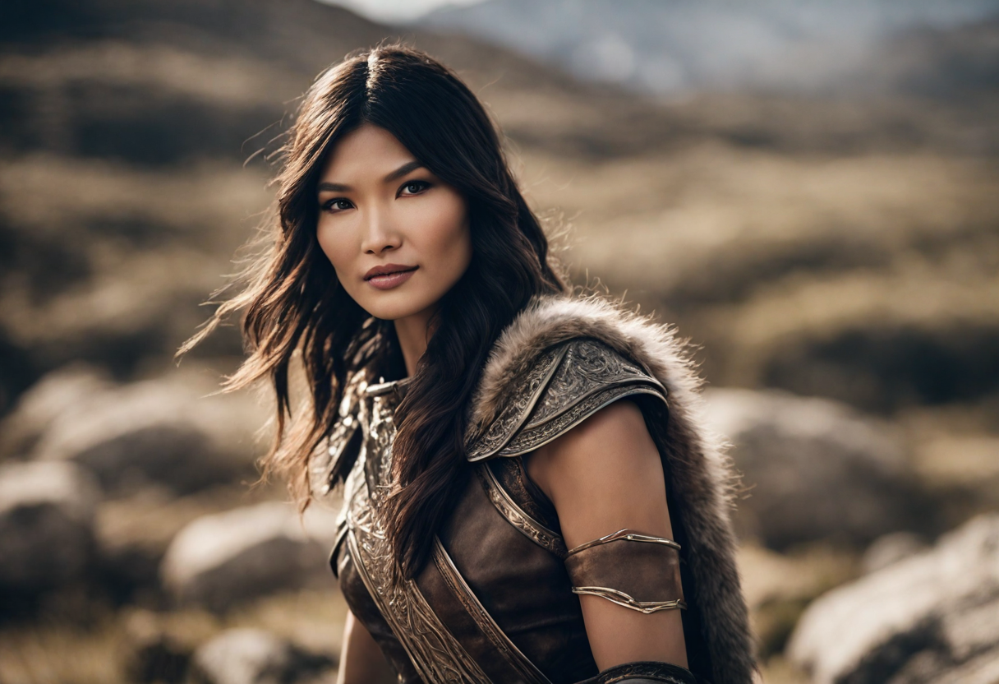

  0%|          | 0/50 [00:00<?, ?it/s]

""

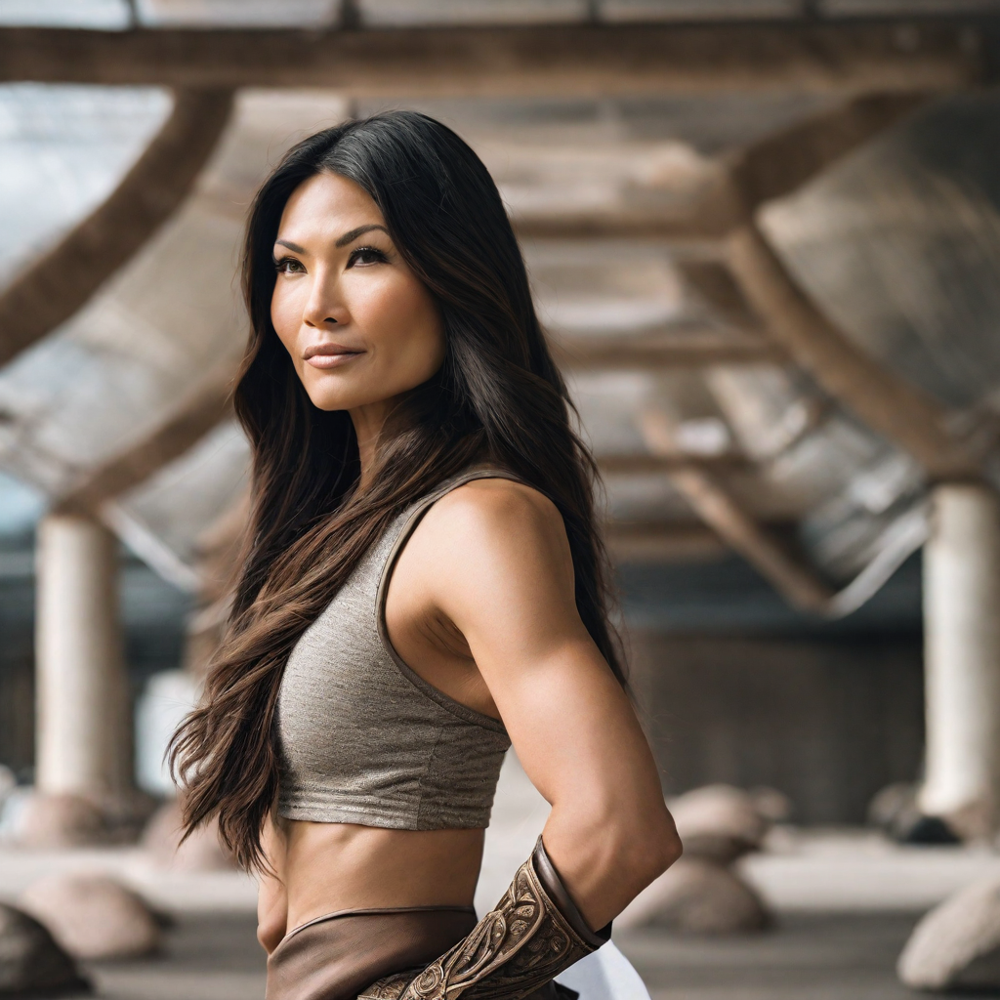

  0%|          | 0/50 [00:00<?, ?it/s]

""

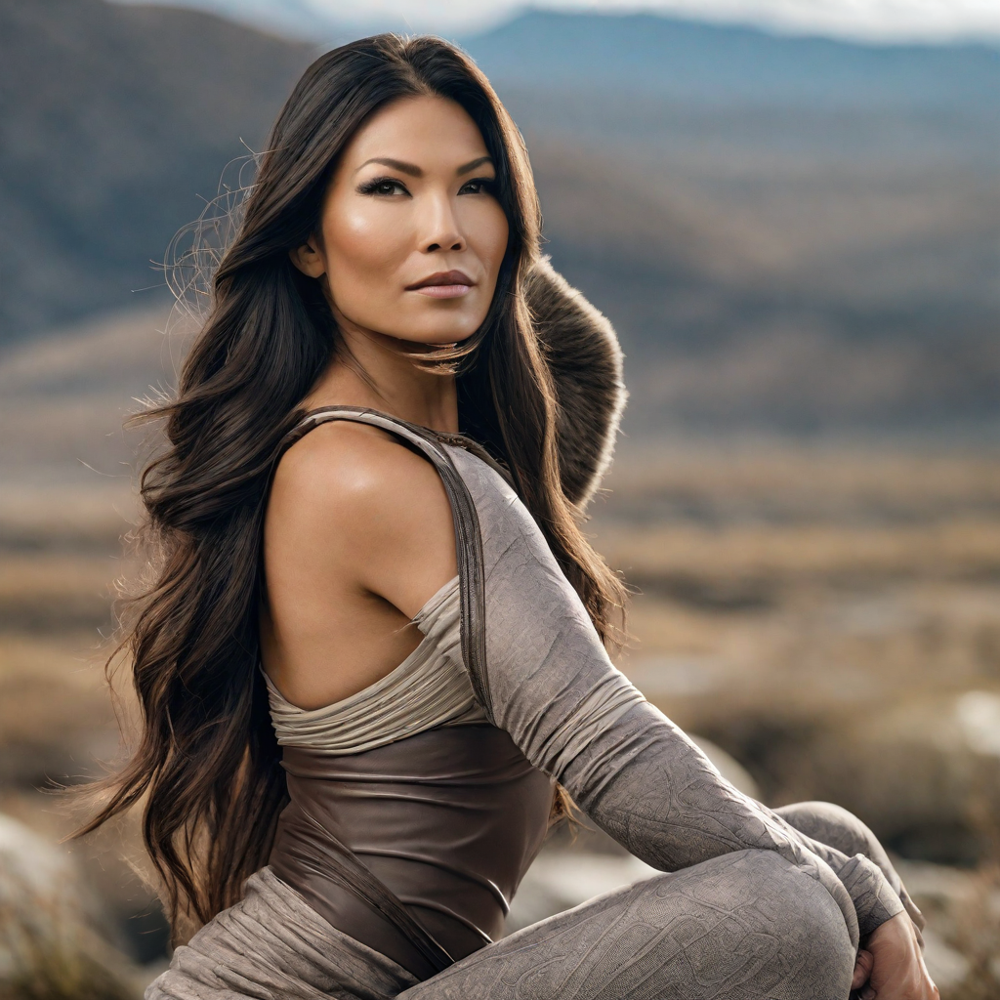

  0%|          | 0/50 [00:00<?, ?it/s]

""

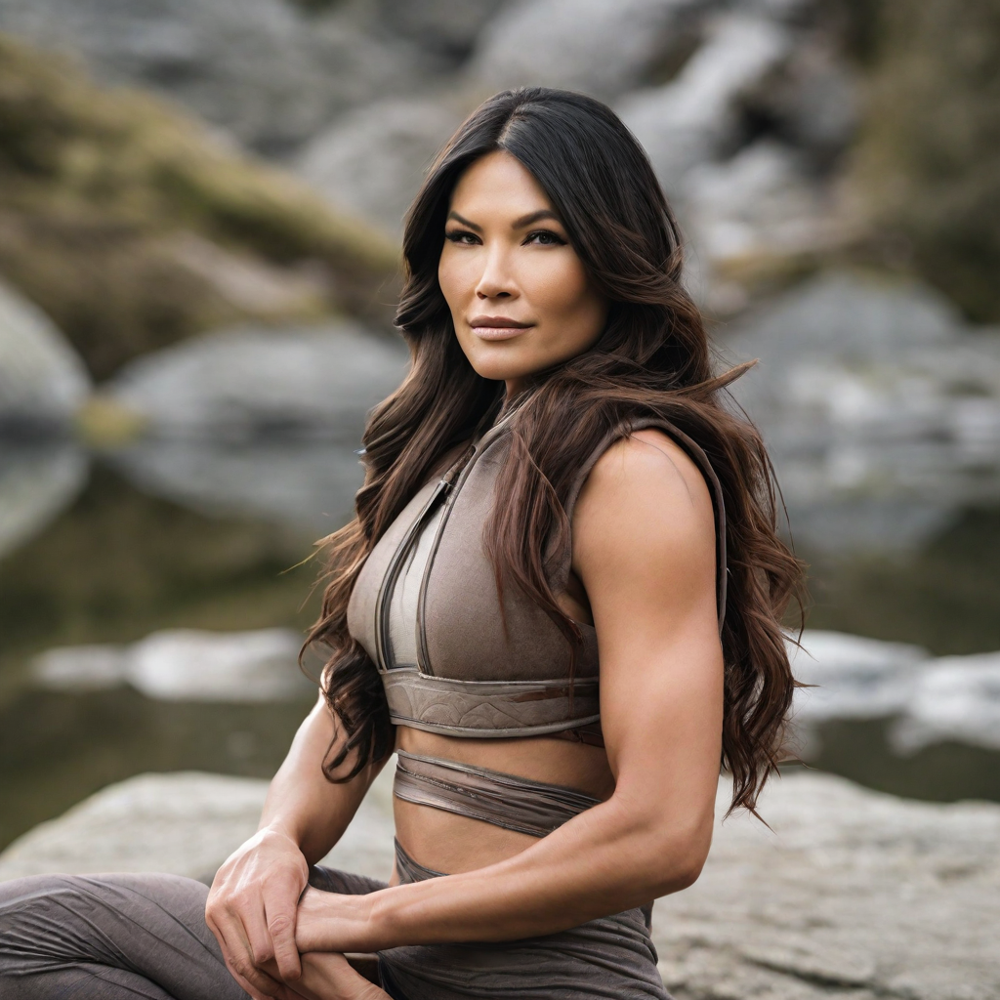

  0%|          | 0/50 [00:00<?, ?it/s]

""

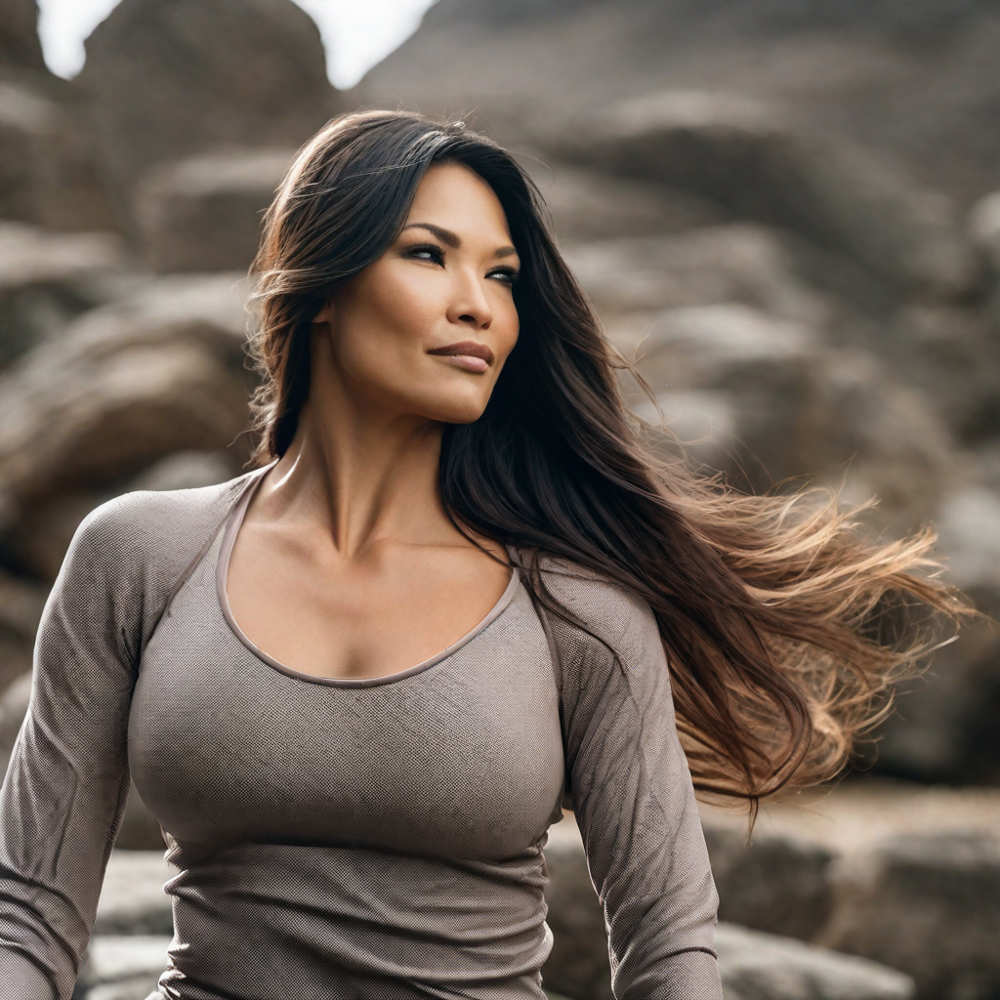

In [3]:
grid = None
images = None
gc.collect()
torch.cuda.empty_cache()

seed = random.randint(0, sys.maxsize)
# read image prompt
ref_images = []
for f in glob.iglob("/content/dd/*"):
    ref_images.append(Image.open(f))


mediapy.show_images(ref_images)

generator = torch.Generator().manual_seed(seed)

prompt_embeds, negative_prompt_embeds, pooled_prompt_embeds, negative_pooled_prompt_embeds = ip_model.get_prompt_embeds(
    ref_images,
    prompt="a woman with long hair in a yoga pose",
      negative_prompt="blurry, horror, worst quality, low quality",
)

ip_model.set_scale(0.5)

for ip_scale in range(4):


  image = pipe(
    prompt_embeds=prompt_embeds,
    negative_prompt_embeds=negative_prompt_embeds,
    pooled_prompt_embeds=pooled_prompt_embeds,
    negative_pooled_prompt_embeds=negative_pooled_prompt_embeds,
    num_inference_steps=50,
    guidance_scale=5.0,
    num_images_per_prompt=1,
    height=1024,
    width=1024,
    generator=generator,
  ).images[0]

  mediapy.show_image(image)